In [1]:
import numpy as np
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

import keras.backend as K
from keras.models import Sequential, Model, load_model
from keras.layers import Dense, Conv2D
from keras.applications.vgg16 import VGG16, decode_predictions, preprocess_input
from keras.preprocessing.image import load_img, img_to_array

import matplotlib.pyplot as plt

In [2]:
model = VGG16(weights='imagenet', include_top=True)

553467904/553467096 [==============================] - 441s 1us/step


ValueError: Error when checking input: expected input_1 to have shape (224, 224, 3) but got array with shape (299, 299, 3)

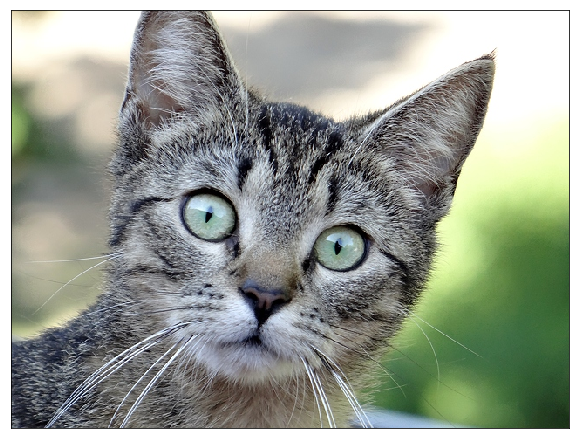

In [3]:
image = load_img('cat.jpg')
plt.figure(figsize=(10, 10))
plt.xticks([])
plt.yticks([])
plt.imshow(image)

image = image.resize((299, 299))
image = img_to_array(image)
image = np.expand_dims(image, axis=0)
image = preprocess_input(image)

pred = model.predict(image)
pred = decode_predictions(pred, top=3)

title = '\n'.join(['%s (%0.2f%%)' % (p[1].capitalize(), 100 * p[2]) for p in pred[0]])

plt.title(title)
plt.show()

In [ ]:
layer = model.get_layer('activation_1')
act_model = Model(inputs=model.input, outputs=layer.output)
act = act_model.predict(image)

In [ ]:
act.shape

In [ ]:
plt.figure(figsize=(10, 10))
plt.matshow(act[0, :, :, 0], cmap='viridis', fignum=1)
plt.xticks([])
plt.yticks([])
plt.show()

In [ ]:
def print_activations(model, layers):
    for l_name in layers:
        layer = model.get_layer(l_name)
        act_model = Model(inputs=model.input, outputs=layer.output)
        act = act_model.predict(image)
        fig, axes = plt.subplots(8, 4, figsize=(15, 30))
        for i in range(8):
            for j in range(4):
                img = act[0, :, :, i * 4 + j]
                axes[i, j].matshow(img)
                axes[i, j].set_xticks([])
                axes[i, j].set_yticks([])
        fig.suptitle(l_name, fontsize=24)
        fig.tight_layout()
        plt.subplots_adjust(top=0.95)
        plt.show()

In [ ]:
print_activations(model, ['activation_1', 'activation_3', 'activation_40'])

In [ ]:
def deprocess_image(x):
#     x = (x + 1) / 2
#     x *= 255
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1
    
    x += 0.5
    x = np.clip(x, 0, 1)
    
    x *= 255
    x = np.clip(x, 0, 255).astype(np.uint8)
#     print(x)
    return x   

In [ ]:
def generate_pattern(model, layer_name, filter_index, epochs=200, size=299):
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])
    
    grads = K.gradients(loss, model.input)[0]
#     grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)
    
    iterate = K.function([model.input], [loss, grads])
    
    input_img_data = 2 * np.random.uniform(size=(1, size, size, 3)) - 1 
    
    step = 1
    for i in range(epochs):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += step * (grads_value/grads_value.std())
        print('grads', grads_value)
#         print('img', input_img_data)
    
    img = input_img_data[0]
#     print(img)
    img = deprocess_image(img)
#     print(img)
    return img

In [ ]:
def vizualize_filters(model, layer_name, n_filters, epochs=200):
    w = 4
    h = np.ceil(n_filters / w)
    plt.figure(figsize=(w * 5, h * 5))
    for i in range(n_filters):
        plt.subplot(h, w, i + 1)
        plt.imshow(generate_pattern(model, layer_name, i, epochs))
        plt.xticks([])
        plt.yticks([])
    plt.tight_layout()
    plt.show()

In [ ]:
model.summary()

grads [[[[-3.58591205e-05  2.47110438e-05  1.73171866e-05]
   [-5.86789974e-05  2.77915824e-05  3.99124983e-05]
   [-4.17411211e-05  3.35317454e-05  1.16184638e-05]
   ...
   [-3.58591205e-05  2.47110438e-05  1.73171866e-05]
   [-5.86789974e-05  2.77915824e-05  3.99124983e-05]
   [-5.88199919e-06  8.82070344e-06 -5.69872236e-06]]

  [[-2.41873440e-05  1.44676851e-05  1.25163315e-05]
   [-4.29594074e-05  1.49142124e-05  2.88422525e-05]
   [-2.89768741e-05  1.77111669e-05  1.04626743e-05]
   ...
   [-2.41873440e-05  1.44676851e-05  1.25163315e-05]
   [-4.29594074e-05  1.49142124e-05  2.88422525e-05]
   [-4.78953052e-06  3.24348184e-06 -2.05365745e-06]]

  [[ 1.25869101e-05  4.99350062e-06 -1.77708716e-05]
   [ 3.17274953e-06  2.58826367e-06 -4.19114758e-06]
   [ 1.91190647e-05  1.39268423e-05 -3.29351788e-05]
   ...
   [-2.91542092e-05  3.85252497e-05 -6.15240788e-06]
   [-5.55062470e-05  3.03798461e-05  3.57213503e-05]
   [ 6.50155016e-07  1.77540460e-05 -2.08630281e-05]]

  ...

  [[ 1

grads [[[[-3.58591205e-05  2.47110438e-05  1.73171866e-05]
   [-5.86789974e-05  2.77915824e-05  3.99124983e-05]
   [-4.17411211e-05  3.35317454e-05  1.16184638e-05]
   ...
   [-4.17411211e-05  3.35317454e-05  1.16184638e-05]
   [-5.86789974e-05  2.77915824e-05  3.99124983e-05]
   [-5.88199919e-06  8.82070344e-06 -5.69872236e-06]]

  [[-2.41873440e-05  1.44676851e-05  1.25163315e-05]
   [-4.29594074e-05  1.49142124e-05  2.88422525e-05]
   [-2.89768741e-05  1.77111669e-05  1.04626743e-05]
   ...
   [-2.89768741e-05  1.77111669e-05  1.04626743e-05]
   [-4.29594074e-05  1.49142124e-05  2.88422525e-05]
   [-4.78953052e-06  3.24348184e-06 -2.05365745e-06]]

  [[ 1.25869101e-05  4.99350062e-06 -1.77708716e-05]
   [ 3.17274953e-06  2.58826367e-06 -4.19114758e-06]
   [ 1.91190647e-05  1.39268423e-05 -3.29351788e-05]
   ...
   [-2.26220545e-05  4.74585904e-05 -2.13167150e-05]
   [-5.55062470e-05  3.03798461e-05  3.57213503e-05]
   [ 6.50155016e-07  1.77540460e-05 -2.08630281e-05]]

  ...

  [[ 1

grads [[[[-3.58591205e-05  2.47110438e-05  1.73171866e-05]
   [-5.86789974e-05  2.77915824e-05  3.99124983e-05]
   [-4.17411211e-05  3.35317454e-05  1.16184638e-05]
   ...
   [-4.17411211e-05  3.35317454e-05  1.16184638e-05]
   [-5.86789974e-05  2.77915824e-05  3.99124983e-05]
   [-5.88199919e-06  8.82070344e-06 -5.69872236e-06]]

  [[-2.41873440e-05  1.44676851e-05  1.25163315e-05]
   [-4.29594074e-05  1.49142124e-05  2.88422525e-05]
   [-2.89768741e-05  1.77111669e-05  1.04626743e-05]
   ...
   [-2.89768741e-05  1.77111669e-05  1.04626743e-05]
   [-4.29594074e-05  1.49142124e-05  2.88422525e-05]
   [-4.78953052e-06  3.24348184e-06 -2.05365745e-06]]

  [[ 1.25869101e-05  4.99350062e-06 -1.77708716e-05]
   [ 3.17274953e-06  2.58826367e-06 -4.19114758e-06]
   [ 1.91190647e-05  1.39268423e-05 -3.29351788e-05]
   ...
   [-2.26220545e-05  4.74585904e-05 -2.13167150e-05]
   [-5.55062470e-05  3.03798461e-05  3.57213503e-05]
   [ 6.50155016e-07  1.77540460e-05 -2.08630281e-05]]

  ...

  [[ 1

grads [[[[-3.58591205e-05  2.47110438e-05  1.73171866e-05]
   [-5.86789974e-05  2.77915824e-05  3.99124983e-05]
   [-4.17411211e-05  3.35317454e-05  1.16184638e-05]
   ...
   [-4.17411211e-05  3.35317454e-05  1.16184638e-05]
   [-5.86789974e-05  2.77915824e-05  3.99124983e-05]
   [-5.88199919e-06  8.82070344e-06 -5.69872236e-06]]

  [[-2.41873440e-05  1.44676851e-05  1.25163315e-05]
   [-4.29594074e-05  1.49142124e-05  2.88422525e-05]
   [-2.89768741e-05  1.77111669e-05  1.04626743e-05]
   ...
   [-2.89768741e-05  1.77111669e-05  1.04626743e-05]
   [-4.29594074e-05  1.49142124e-05  2.88422525e-05]
   [-4.78953052e-06  3.24348184e-06 -2.05365745e-06]]

  [[ 1.25869101e-05  4.99350062e-06 -1.77708716e-05]
   [ 3.17274953e-06  2.58826367e-06 -4.19114758e-06]
   [ 1.91190647e-05  1.39268423e-05 -3.29351788e-05]
   ...
   [-2.26220545e-05  4.74585904e-05 -2.13167150e-05]
   [-5.55062470e-05  3.03798461e-05  3.57213503e-05]
   [ 6.50155016e-07  1.77540460e-05 -2.08630281e-05]]

  ...

  [[ 1

grads [[[[-3.58591205e-05  2.47110438e-05  1.73171866e-05]
   [-5.86789974e-05  2.77915824e-05  3.99124983e-05]
   [-4.17411211e-05  3.35317454e-05  1.16184638e-05]
   ...
   [-4.17411211e-05  3.35317454e-05  1.16184638e-05]
   [-5.86789974e-05  2.77915824e-05  3.99124983e-05]
   [-5.88199919e-06  8.82070344e-06 -5.69872236e-06]]

  [[-2.41873440e-05  1.44676851e-05  1.25163315e-05]
   [-4.29594074e-05  1.49142124e-05  2.88422525e-05]
   [-2.89768741e-05  1.77111669e-05  1.04626743e-05]
   ...
   [-2.89768741e-05  1.77111669e-05  1.04626743e-05]
   [-4.29594074e-05  1.49142124e-05  2.88422525e-05]
   [-4.78953052e-06  3.24348184e-06 -2.05365745e-06]]

  [[ 1.25869101e-05  4.99350062e-06 -1.77708716e-05]
   [ 3.17274953e-06  2.58826367e-06 -4.19114758e-06]
   [ 1.91190647e-05  1.39268423e-05 -3.29351788e-05]
   ...
   [-2.26220545e-05  4.74585904e-05 -2.13167150e-05]
   [-5.55062470e-05  3.03798461e-05  3.57213503e-05]
   [ 6.50155016e-07  1.77540460e-05 -2.08630281e-05]]

  ...

  [[-2

grads [[[[-3.58591205e-05  2.47110438e-05  1.73171866e-05]
   [-5.86789974e-05  2.77915824e-05  3.99124983e-05]
   [-4.17411211e-05  3.35317454e-05  1.16184638e-05]
   ...
   [-4.17411211e-05  3.35317454e-05  1.16184638e-05]
   [-5.86789974e-05  2.77915824e-05  3.99124983e-05]
   [-5.88199919e-06  8.82070344e-06 -5.69872236e-06]]

  [[-2.41873440e-05  1.44676851e-05  1.25163315e-05]
   [-4.29594074e-05  1.49142124e-05  2.88422525e-05]
   [-2.89768741e-05  1.77111669e-05  1.04626743e-05]
   ...
   [-2.89768741e-05  1.77111669e-05  1.04626743e-05]
   [-4.29594074e-05  1.49142124e-05  2.88422525e-05]
   [-4.78953052e-06  3.24348184e-06 -2.05365745e-06]]

  [[ 1.25869101e-05  4.99350062e-06 -1.77708716e-05]
   [ 3.17274953e-06  2.58826367e-06 -4.19114758e-06]
   [ 1.91190647e-05  1.39268423e-05 -3.29351788e-05]
   ...
   [-2.26220545e-05  4.74585904e-05 -2.13167150e-05]
   [-5.55062470e-05  3.03798461e-05  3.57213503e-05]
   [ 6.50155016e-07  1.77540460e-05 -2.08630281e-05]]

  ...

  [[-2

grads [[[[-3.58591205e-05  2.47110438e-05  1.73171866e-05]
   [-5.86789974e-05  2.77915824e-05  3.99124983e-05]
   [-4.17411211e-05  3.35317454e-05  1.16184638e-05]
   ...
   [-4.17411211e-05  3.35317454e-05  1.16184638e-05]
   [-5.86789974e-05  2.77915824e-05  3.99124983e-05]
   [-5.88199919e-06  8.82070344e-06 -5.69872236e-06]]

  [[-2.41873440e-05  1.44676851e-05  1.25163315e-05]
   [-4.29594074e-05  1.49142124e-05  2.88422525e-05]
   [-2.89768741e-05  1.77111669e-05  1.04626743e-05]
   ...
   [-2.89768741e-05  1.77111669e-05  1.04626743e-05]
   [-4.29594074e-05  1.49142124e-05  2.88422525e-05]
   [-4.78953052e-06  3.24348184e-06 -2.05365745e-06]]

  [[ 1.25869101e-05  4.99350062e-06 -1.77708716e-05]
   [ 3.17274953e-06  2.58826367e-06 -4.19114758e-06]
   [ 1.91190647e-05  1.39268423e-05 -3.29351788e-05]
   ...
   [-2.26220545e-05  4.74585904e-05 -2.13167150e-05]
   [-5.55062470e-05  3.03798461e-05  3.57213503e-05]
   [ 6.50155016e-07  1.77540460e-05 -2.08630281e-05]]

  ...

  [[-2

grads [[[[-3.58591205e-05  2.47110438e-05  1.73171866e-05]
   [-5.86789974e-05  2.77915824e-05  3.99124983e-05]
   [-4.17411211e-05  3.35317454e-05  1.16184638e-05]
   ...
   [-4.17411211e-05  3.35317454e-05  1.16184638e-05]
   [-5.86789974e-05  2.77915824e-05  3.99124983e-05]
   [-5.88199919e-06  8.82070344e-06 -5.69872236e-06]]

  [[-2.41873440e-05  1.44676851e-05  1.25163315e-05]
   [-4.29594074e-05  1.49142124e-05  2.88422525e-05]
   [-2.89768741e-05  1.77111669e-05  1.04626743e-05]
   ...
   [-2.89768741e-05  1.77111669e-05  1.04626743e-05]
   [-4.29594074e-05  1.49142124e-05  2.88422525e-05]
   [-4.78953052e-06  3.24348184e-06 -2.05365745e-06]]

  [[ 1.25869101e-05  4.99350062e-06 -1.77708716e-05]
   [ 3.17274953e-06  2.58826367e-06 -4.19114758e-06]
   [ 1.91190647e-05  1.39268423e-05 -3.29351788e-05]
   ...
   [-2.26220545e-05  4.74585904e-05 -2.13167150e-05]
   [-5.55062470e-05  3.03798461e-05  3.57213503e-05]
   [ 6.50155016e-07  1.77540460e-05 -2.08630281e-05]]

  ...

  [[-2

grads [[[[ 0.0000000e+00  0.0000000e+00  0.0000000e+00]
   [ 0.0000000e+00  0.0000000e+00  0.0000000e+00]
   [ 0.0000000e+00  0.0000000e+00  0.0000000e+00]
   ...
   [ 0.0000000e+00  0.0000000e+00  0.0000000e+00]
   [ 0.0000000e+00  0.0000000e+00  0.0000000e+00]
   [ 0.0000000e+00  0.0000000e+00  0.0000000e+00]]

  [[ 0.0000000e+00  0.0000000e+00  0.0000000e+00]
   [ 0.0000000e+00  0.0000000e+00  0.0000000e+00]
   [ 0.0000000e+00  0.0000000e+00  0.0000000e+00]
   ...
   [ 0.0000000e+00  0.0000000e+00  0.0000000e+00]
   [ 0.0000000e+00  0.0000000e+00  0.0000000e+00]
   [ 0.0000000e+00  0.0000000e+00  0.0000000e+00]]

  [[ 0.0000000e+00  0.0000000e+00  0.0000000e+00]
   [ 0.0000000e+00  0.0000000e+00  0.0000000e+00]
   [ 0.0000000e+00  0.0000000e+00  0.0000000e+00]
   ...
   [ 0.0000000e+00  0.0000000e+00  0.0000000e+00]
   [ 0.0000000e+00  0.0000000e+00  0.0000000e+00]
   [ 0.0000000e+00  0.0000000e+00  0.0000000e+00]]

  ...

  [[ 0.0000000e+00  0.0000000e+00  0.0000000e+00]
   [ 0.000

grads [[[[ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   ...
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]]

  [[ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   ...
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]]

  [[ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   ...
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]]

  ...

  [[-3

grads [[[[ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   ...
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]]

  [[ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   ...
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]]

  [[ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   ...
   [-2.48335186e-06 -1.78560231e-06  4.19779508e-06]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]]

  ...

  [[-8

grads [[[[ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   ...
   [-7.46089427e-06 -2.36016740e-06  3.88915305e-06]
   [ 4.18122818e-06 -3.77815491e-06  9.65743948e-06]
   [-2.48335186e-06 -1.78560231e-06  4.19779508e-06]]

  [[ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   ...
   [ 4.79557184e-06  2.72785928e-06  1.84242926e-05]
   [ 1.72848086e-05  5.20645881e-06  2.36682663e-05]
   [ 2.00734507e-06  1.26927046e-06  1.21697667e-05]]

  [[ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   ...
   [-2.08583187e-05 -3.33572279e-06  1.63615041e-05]
   [ 2.56258818e-06 -5.61428033e-06  2.08988749e-05]
   [-1.24396474e-05 -2.29297666e-06  1.22831916e-05]]

  ...

  [[-8

grads [[[[ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   ...
   [-7.46089427e-06 -2.36016740e-06  3.88915305e-06]
   [ 4.18122818e-06 -3.77815491e-06  9.65743948e-06]
   [-2.48335186e-06 -1.78560231e-06  4.19779508e-06]]

  [[ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   ...
   [ 4.79557184e-06  2.72785928e-06  1.84242926e-05]
   [ 1.72848086e-05  5.20645881e-06  2.36682663e-05]
   [ 2.00734507e-06  1.26927046e-06  1.21697667e-05]]

  [[ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   ...
   [-2.08583187e-05 -3.33572279e-06  1.63615041e-05]
   [ 2.56258818e-06 -5.61428033e-06  2.08988749e-05]
   [-1.24396474e-05 -2.29297666e-06  1.22831916e-05]]

  ...

  [[-8

grads [[[[ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   ...
   [-7.46089427e-06 -2.36016740e-06  3.88915305e-06]
   [ 4.18122818e-06 -3.77815491e-06  9.65743948e-06]
   [-2.48335186e-06 -1.78560231e-06  4.19779508e-06]]

  [[ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   ...
   [ 4.79557184e-06  2.72785928e-06  1.84242926e-05]
   [ 1.72848086e-05  5.20645881e-06  2.36682663e-05]
   [ 2.00734507e-06  1.26927046e-06  1.21697667e-05]]

  [[ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   [ 0.00000000e+00  0.00000000e+00  0.00000000e+00]
   ...
   [-2.08583187e-05 -3.33572279e-06  1.63615041e-05]
   [ 2.56258818e-06 -5.61428033e-06  2.08988749e-05]
   [-1.24396474e-05 -2.29297666e-06  1.22831916e-05]]

  ...

  [[-8

grads [[[[-2.88246298e-07 -5.44316720e-07 -1.26802925e-05]
   [-6.35172819e-06  1.01922806e-05  7.82741427e-06]
   [ 6.82432437e-06  4.85083410e-06 -2.69871634e-05]
   ...
   [ 6.82432437e-06  4.85083410e-06 -2.69871634e-05]
   [-6.35172819e-06  1.01922806e-05  7.82741427e-06]
   [ 7.11257053e-06  5.39515077e-06 -1.43068719e-05]]

  [[-1.56449041e-05  9.15146211e-06  8.32107071e-06]
   [-4.05487190e-05  3.37198180e-05  4.88894693e-05]
   [-3.32703494e-05  2.68072545e-05  2.99402491e-05]
   ...
   [-3.32703494e-05  2.68072545e-05  2.99402491e-05]
   [-4.05487190e-05  3.37198180e-05  4.88894693e-05]
   [-1.76254471e-05  1.76557915e-05  2.16191784e-05]]

  [[ 5.36856123e-06 -1.48795323e-07 -2.39981564e-05]
   [-2.86673276e-05  1.51478907e-05  2.09637856e-05]
   [ 7.16822979e-06  1.08353352e-05 -3.31002084e-05]
   ...
   [ 7.16822979e-06  1.08353352e-05 -3.31002084e-05]
   [-2.86673276e-05  1.51478907e-05  2.09637856e-05]
   [ 1.79966855e-06  1.09841303e-05 -9.10205290e-06]]

  ...

  [[ 5

grads [[[[-2.88246298e-07 -5.44316720e-07 -1.26802925e-05]
   [-6.35172819e-06  1.01922806e-05  7.82741427e-06]
   [ 6.82432437e-06  4.85083410e-06 -2.69871634e-05]
   ...
   [ 6.82432437e-06  4.85083410e-06 -2.69871634e-05]
   [-6.35172819e-06  1.01922806e-05  7.82741427e-06]
   [ 7.11257053e-06  5.39515077e-06 -1.43068719e-05]]

  [[-1.56449041e-05  9.15146211e-06  8.32107071e-06]
   [-4.05487190e-05  3.37198180e-05  4.88894693e-05]
   [-3.32703494e-05  2.68072545e-05  2.99402491e-05]
   ...
   [-3.32703494e-05  2.68072545e-05  2.99402491e-05]
   [-4.05487190e-05  3.37198180e-05  4.88894693e-05]
   [-1.76254471e-05  1.76557915e-05  2.16191784e-05]]

  [[ 5.36856123e-06 -1.48795323e-07 -2.39981564e-05]
   [-2.86673276e-05  1.51478907e-05  2.09637856e-05]
   [ 7.16822979e-06  1.08353352e-05 -3.31002084e-05]
   ...
   [ 7.16822979e-06  1.08353352e-05 -3.31002084e-05]
   [-2.86673276e-05  1.51478907e-05  2.09637856e-05]
   [ 1.79966855e-06  1.09841303e-05 -9.10205290e-06]]

  ...

  [[ 5

grads [[[[-2.88246298e-07 -5.44316720e-07 -1.26802925e-05]
   [-6.35172819e-06  1.01922806e-05  7.82741427e-06]
   [ 6.82432437e-06  4.85083410e-06 -2.69871634e-05]
   ...
   [ 6.82432437e-06  4.85083410e-06 -2.69871634e-05]
   [-6.35172819e-06  1.01922806e-05  7.82741427e-06]
   [ 7.11257053e-06  5.39515077e-06 -1.43068719e-05]]

  [[-1.56449041e-05  9.15146211e-06  8.32107071e-06]
   [-4.05487190e-05  3.37198180e-05  4.88894693e-05]
   [-3.32703494e-05  2.68072545e-05  2.99402491e-05]
   ...
   [-3.32703494e-05  2.68072545e-05  2.99402491e-05]
   [-4.05487190e-05  3.37198180e-05  4.88894693e-05]
   [-1.76254471e-05  1.76557915e-05  2.16191784e-05]]

  [[ 5.36856123e-06 -1.48795323e-07 -2.39981564e-05]
   [-2.86673276e-05  1.51478907e-05  2.09637856e-05]
   [ 7.16822979e-06  1.08353352e-05 -3.31002084e-05]
   ...
   [ 7.16822979e-06  1.08353352e-05 -3.31002084e-05]
   [-2.86673276e-05  1.51478907e-05  2.09637856e-05]
   [ 1.79966855e-06  1.09841303e-05 -9.10205290e-06]]

  ...

  [[ 5

grads [[[[-2.88246298e-07 -5.44316720e-07 -1.26802925e-05]
   [-6.35172819e-06  1.01922806e-05  7.82741427e-06]
   [ 6.82432437e-06  4.85083410e-06 -2.69871634e-05]
   ...
   [ 6.82432437e-06  4.85083410e-06 -2.69871634e-05]
   [-6.35172819e-06  1.01922806e-05  7.82741427e-06]
   [ 7.11257053e-06  5.39515077e-06 -1.43068719e-05]]

  [[-1.56449041e-05  9.15146211e-06  8.32107071e-06]
   [-4.05487190e-05  3.37198180e-05  4.88894693e-05]
   [-3.32703494e-05  2.68072545e-05  2.99402491e-05]
   ...
   [-3.32703494e-05  2.68072545e-05  2.99402491e-05]
   [-4.05487190e-05  3.37198180e-05  4.88894693e-05]
   [-1.76254471e-05  1.76557915e-05  2.16191784e-05]]

  [[ 5.36856123e-06 -1.48795323e-07 -2.39981564e-05]
   [-2.86673276e-05  1.51478907e-05  2.09637856e-05]
   [ 7.16822979e-06  1.08353352e-05 -3.31002084e-05]
   ...
   [ 7.16822979e-06  1.08353352e-05 -3.31002084e-05]
   [-2.86673276e-05  1.51478907e-05  2.09637856e-05]
   [ 1.79966855e-06  1.09841303e-05 -9.10205290e-06]]

  ...

  [[ 5

grads [[[[-2.88246298e-07 -5.44316720e-07 -1.26802925e-05]
   [-6.35172819e-06  1.01922806e-05  7.82741427e-06]
   [ 6.82432437e-06  4.85083410e-06 -2.69871634e-05]
   ...
   [ 6.82432437e-06  4.85083410e-06 -2.69871634e-05]
   [-6.35172819e-06  1.01922806e-05  7.82741427e-06]
   [ 7.11257053e-06  5.39515077e-06 -1.43068719e-05]]

  [[-1.56449041e-05  9.15146211e-06  8.32107071e-06]
   [-4.05487190e-05  3.37198180e-05  4.88894693e-05]
   [-3.32703494e-05  2.68072545e-05  2.99402491e-05]
   ...
   [-3.32703494e-05  2.68072545e-05  2.99402491e-05]
   [-4.05487190e-05  3.37198180e-05  4.88894693e-05]
   [-1.76254471e-05  1.76557915e-05  2.16191784e-05]]

  [[ 5.36856123e-06 -1.48795323e-07 -2.39981564e-05]
   [-2.86673276e-05  1.51478907e-05  2.09637856e-05]
   [ 7.16822979e-06  1.08353352e-05 -3.31002084e-05]
   ...
   [ 7.16822979e-06  1.08353352e-05 -3.31002084e-05]
   [-2.86673276e-05  1.51478907e-05  2.09637856e-05]
   [ 1.79966855e-06  1.09841303e-05 -9.10205290e-06]]

  ...

  [[ 5

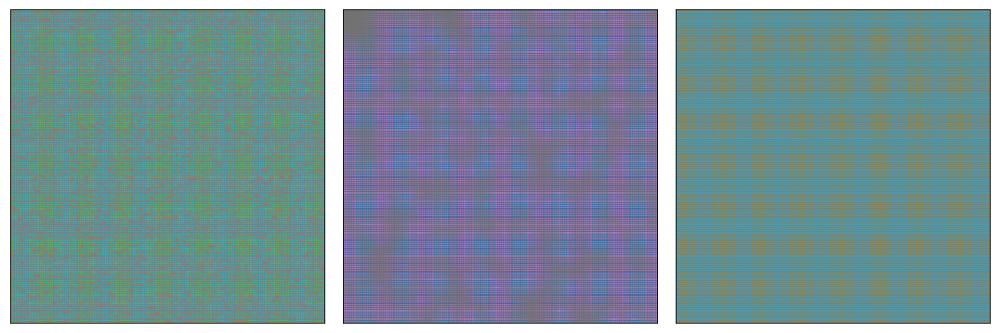

In [46]:
vizualize_filters(model, 'activation_1', 3, epochs=40)

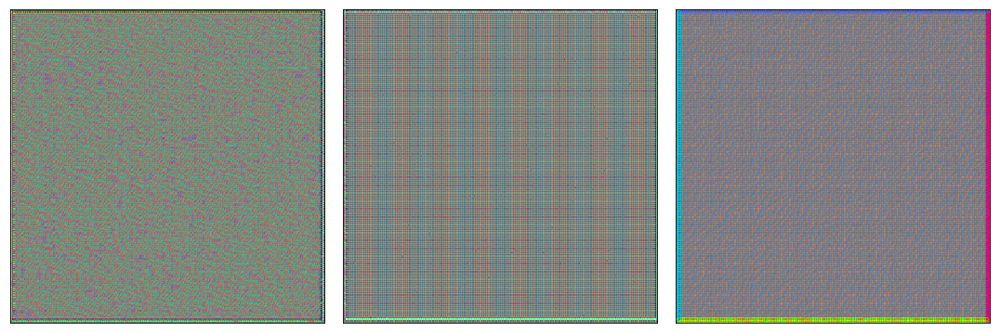

In [40]:
vizualize_filters(model, 'conv2d_2', 3, epochs=100)

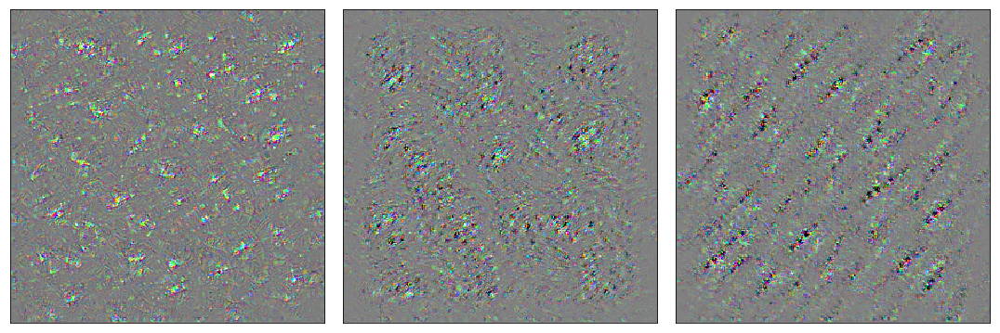

In [41]:
vizualize_filters(model, 'conv2d_40', 3, epochs=100)

In [12]:
ap_model = load_model('bn_unfreezed_head.hdf5')

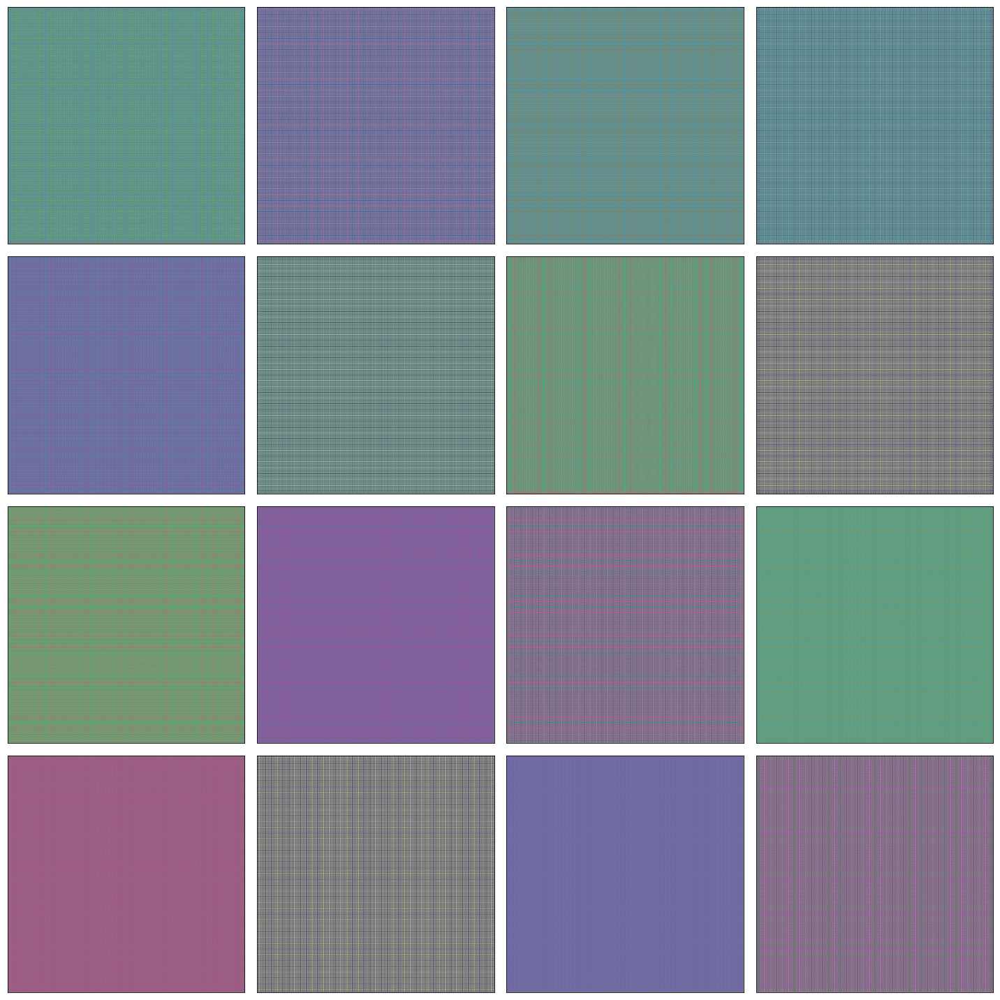

In [21]:
vizualize_filters(ap_model, 'conv2d_189', 16, epochs=500)

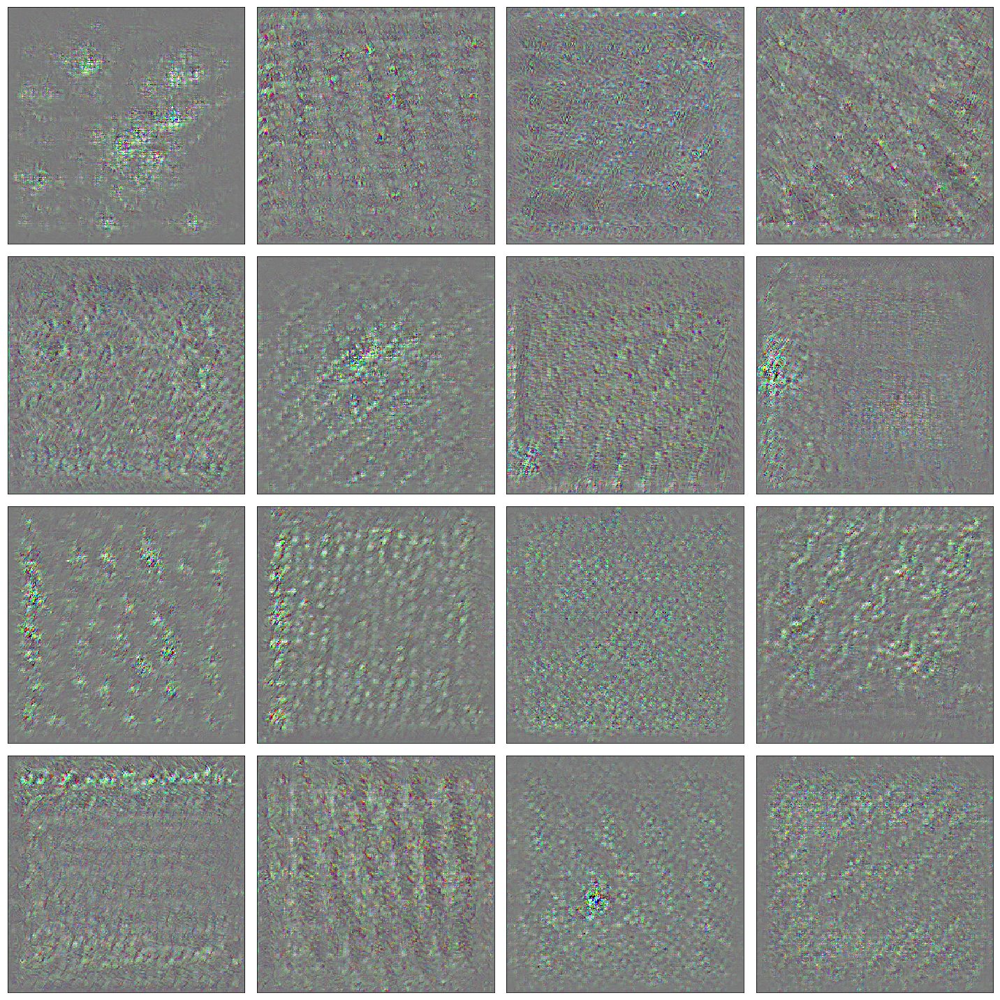

In [22]:
vizualize_filters(ap_model, 'conv2d_238', 16, epochs=500)

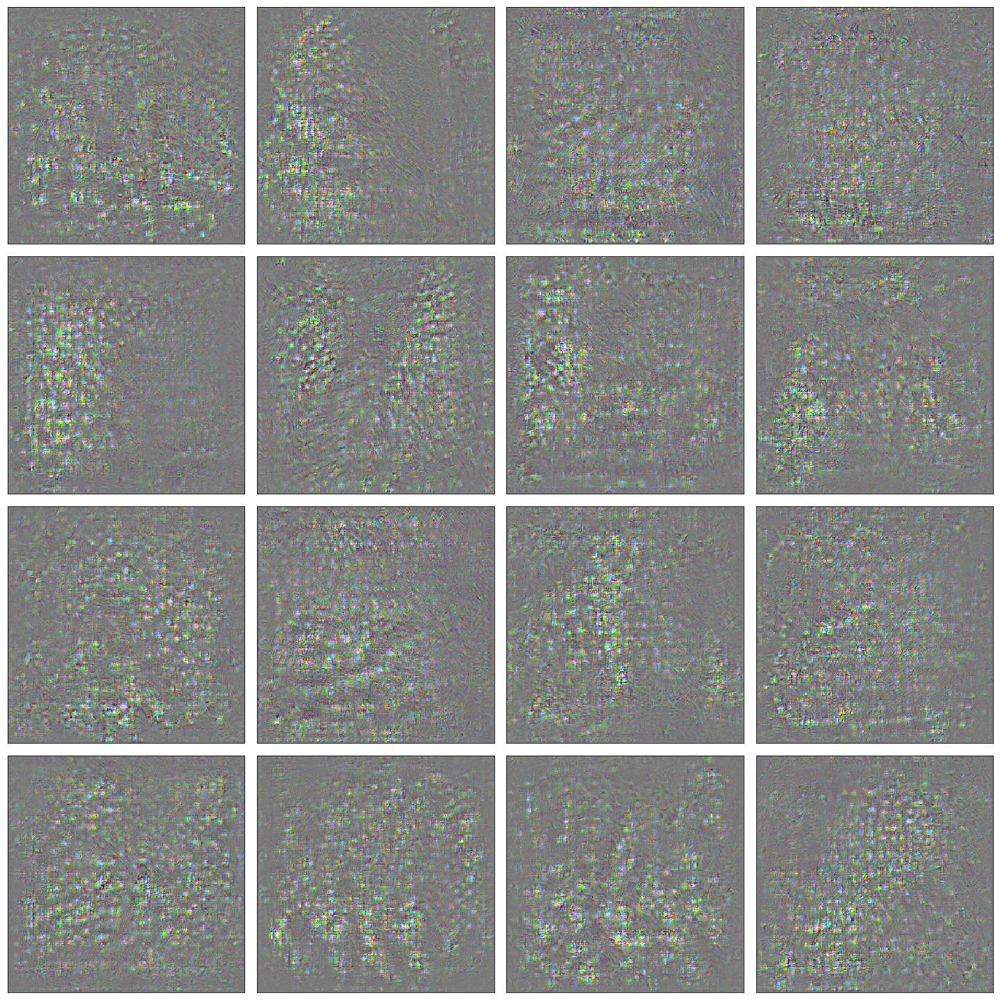

In [23]:
vizualize_filters(ap_model, 'conv2d_282', 16, epochs=500)